# UNSW-NB 15 Dataset ML Methods Comparison Notebook - Attack or Normal Response

This notebook would implement several machine learning methods:

- Logistic Regression
- Decision Trees
- Random Forest
- Neural Networks: we will use Multi-layer perceptron.

We will illustrate them and compare their performances using the raw network packets of the UNSW-NB 15 dataset was created by the IXIA PerfectStorm tool in the Cyber Range Lab of the Australian Centre for Cyber Security (ACCS) for generating a hybrid of real modern normal activities and synthetic contemporary attack behaviours. Further information found at https://www.unsw.adfa.edu.au/unsw-canberra-cyber/cybersecurity/ADFA-NB15-Datasets/


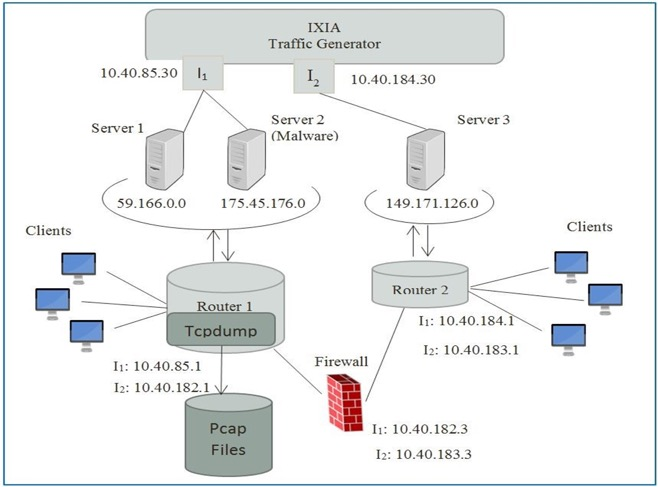









Tcpdump tool is utilised to capture 100 GB of the raw traffic (e.g., Pcap files). This dataset has nine types of attacks, namely, Fuzzers, Analysis, Backdoors, DoS, Exploits, Generic, Reconnaissance, Shellcode and Worms. The Argus, Bro-IDS tools are used and twelve algorithms are developed to generate totally 49 features with the class label.

These features are described in UNSW-NB15_features.csv file.

A partition from this dataset is configured as a training set and testing set, namely, UNSW_NB15_training-set.csv and UNSW_NB15_testing-set.csv respectively.

The number of records in the training set is 175,341 records and the testing set is 82,332 records from the different types, attack and normal.Figure 1 and 2 show the testbed configuration dataset and the method of the feature creation of the UNSW-NB15, respectively.

The details of the UNSW-NB15 dataset are published in following the papers:

Moustafa, Nour, and Jill Slay. "UNSW-NB15: a comprehensive data set for network intrusion detection systems (UNSW-NB15 network data set)." Military Communications and Information Systems Conference (MilCIS), 2015. IEEE, 2015.
Moustafa, Nour, and Jill Slay. "The evaluation of Network Anomaly Detection Systems: Statistical analysis of the UNSW-NB15 dataset and the comparison with the KDD99 dataset." Information Security Journal: A Global Perspective (2016): 1-14.
Moustafa, Nour, et al. . "Novel geometric area analysis technique for anomaly detection using trapezoidal area estimation on large-scale networks." IEEE Transactions on Big Data (2017).
Moustafa, Nour, et al. "Big data analytics for intrusion detection system: statistical decision-making using finite dirichlet mixture models." Data Analytics and Decision Support for Cybersecurity. Springer, Cham, 2017. 127-156.

Free use of the UNSW-NB15 dataset for academic research purposes is hereby granted in perpetuity. Use for commercial purposes should be agreed by the authors. Nour Moustafa and Jill Slay have asserted their rights under the Copyright. To whom intend the use of the UNSW-NB15 dataset have to cite the above two papers.


For more information, please contact the authors: Harshil Patel & Yuesheng Chen are a students in Industrial Engineering at Ohio State University, and they are interested in new Cyber threat intelligence approaches and the technology of Industry 4.0. 

In this notebook, the operations conducted include:

- Preprocessing the data to prepare for training ML models.
- Training ML models based on cross-validation.
- Evaluating ML models based on testing data.

# Libraries

Import libararies to implement the described machine learning methods using a few different `sklearn` algorithms.

In [4]:
# data cleaning and plots
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
plt.style.use('ggplot')
%matplotlib inline

# sklearn: data preprocessing
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, LabelEncoder, OneHotEncoder

# sklearn: train model
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score, cross_validate, StratifiedKFold
from sklearn.metrics import precision_recall_curve, precision_score, recall_score, f1_score, accuracy_score
from sklearn.metrics import roc_curve, auc, roc_auc_score, confusion_matrix, classification_report

# sklearn classifiers
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier

# Data Processing

## Load Data

**UNSW-NB15: a comprehensive data set for network intrusion detection systems**

These features are described in UNSW-NB15_features.csv file.

A partition from this dataset is configured as a training set and testing set, namely, UNSW_NB15_training-set.csv and UNSW_NB15_testing-set.csv respectively.

The number of records in the training set is 175,341 records and the testing set is 82,332 records from the different types, attack and normal.Figure 1 and 2 show the testbed configuration dataset and the method of the feature creation of the UNSW-NB15, respectively. The addtional features are as described in UNSW-NB15_features.csv file.

Response Variable:

attack_cat: This dataset has nine types of attacks, namely, Fuzzers, Analysis, Backdoors, DoS, Exploits, Generic, Reconnaissance, Shellcode and Worms.

Label: 0 for normal and 1 for attack records


In [5]:
# Load data
initial_data = pd.read_csv('UNSW_NB15_training.csv')

In [6]:
# Look at the first 5 rows
initial_data.head(n=5)

,dur,spkts,dpkts,sbytes,dbytes,rate,sttl,dttl,sload,dload,...,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,attack_cat,label
0,0.121478,6,4,258,172,74.087490,252,254,14158.942380,8495.365234,...,1,1,0,0,0,1,1,0,Normal,0
1,0.649902,14,38,734,42014,78.473372,62,252,8395.112305,503571.312500,...,1,2,0,0,0,1,6,0,Normal,0
2,1.623129,8,16,364,13186,14.170161,62,252,1572.271851,60929.230470,...,1,3,0,0,0,2,6,0,Normal,0
3,1.681642,12,12,628,770,13.677108,62,252,2740.178955,3358.622070,...,1,3,1,1,0,2,1,0,Normal,0
4,0.449454,10,6,534,268,33.373826,254,252,8561.499023,3987.059814,...,1,40,0,0,0,2,39,0,Normal,0


In [7]:
# information of the data: 583 data points, 10 features' columns and 1 target column
initial_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 175341 entries, 0 to 175340
Data columns (total 41 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   dur                175341 non-null  float64
 1   spkts              175341 non-null  int64  
 2   dpkts              175341 non-null  int64  
 3   sbytes             175341 non-null  int64  
 4   dbytes             175341 non-null  int64  
 5   rate               175341 non-null  float64
 6   sttl               175341 non-null  int64  
 7   dttl               175341 non-null  int64  
 8   sload              175341 non-null  float64
 9   dload              175341 non-null  float64
 10  sloss              175341 non-null  int64  
 11  dloss              175341 non-null  int64  
 12  sinpkt             175341 non-null  float64
 13  dinpkt             175341 non-null  float64
 14  sjit               175341 non-null  float64
 15  djit               175341 non-null  float64
 16  sw

## Tidy Data

### Check missing values
First, we should check if there are missing values in the dataset. We could see that four patients do not have the value of `Albumin_and_Globulin_Ratio`.

In [8]:
# check if there are Null values
initial_data.isnull().sum()

dur                  0
spkts                0
dpkts                0
sbytes               0
dbytes               0
rate                 0
sttl                 0
dttl                 0
sload                0
dload                0
sloss                0
dloss                0
sinpkt               0
dinpkt               0
sjit                 0
djit                 0
swin                 0
stcpb                0
dtcpb                0
dwin                 0
tcprtt               0
synack               0
ackdat               0
smean                0
dmean                0
trans_depth          0
response_body_len    0
ct_srv_src           0
ct_state_ttl         0
ct_dst_ltm           0
ct_src_dport_ltm     0
ct_dst_sport_ltm     0
ct_dst_src_ltm       0
is_ftp_login         0
ct_ftp_cmd           0
ct_flw_http_mthd     0
ct_src_ltm           0
ct_srv_dst           0
is_sm_ips_ports      0
attack_cat           0
label                0
dtype: int64

A basic strategy to use incomplete datasets is to discard entire rows and/or columns containing missing values. Actually, there exists some strategies to impute missing values (see [here](https://scikit-learn.org/stable/modules/impute.html)). For simplicity, we will discard the four rows with missing values. 

In [13]:
# Discard the rows with missing values
data_to_use = initial_data.dropna()

# Shape of the data: we could see that the number of rows remains the same as no null values were reported
data_to_use.shape

(175341, 41)

### Check imbalanced issue on y

First, we get the `X` and `y1` and `y2` .

In [14]:
X = data_to_use.drop(axis=1, columns=['attack_cat']) # X is a dataframe
X = X.drop(axis=1, columns=['label'])


y1 = data_to_use['attack_cat'].values # y is an array
y2 = data_to_use['label'].values

In [15]:
# Calculate Y2 ratio
def data_ratio(y2):
    '''
    Calculate Y2's ratio
    '''
    unique, count = np.unique(y2, return_counts=True)
    ratio = round(count[0]/count[1], 1)
    return f'{ratio}:1 ({count[0]}/{count[1]})'

The class ratio for the original data: 1.1:1 (2000/1746)


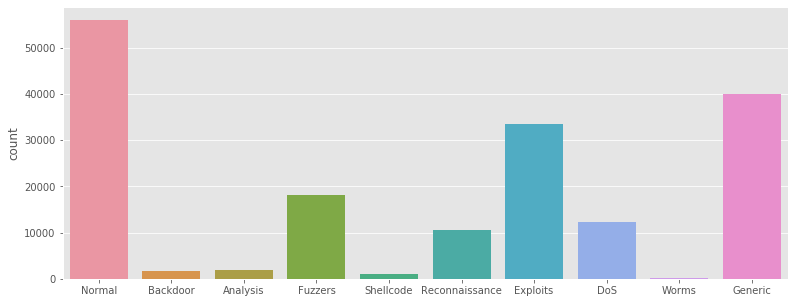

The class ratio for the original data: 0.5:1 (56000/119341)


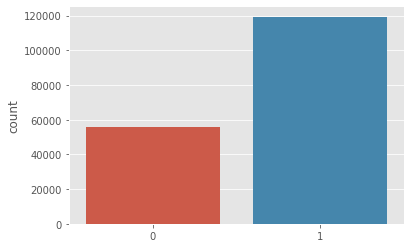

In [16]:
print('The class ratio for the original data:', data_ratio(y1))
plt.figure(figsize=(13,5))
sns.countplot(y1,label="Sum")
plt.show()

print('The class ratio for the original data:', data_ratio(y2))
sns.countplot(y2,label="Sum")
plt.show()

We could see that the dataset is not perfectly balanced. There are some sampling techniques to deal with this issue. Here, we ignore this issue because we are aimed to implement several ML models to compare their performance. 

### Split training and testing data

It is important to split `X` and `y` as training set and testing set. Here, we will split the original data as 70% training set and 30% testing set. But the partition action from this dataset was pre configured as a training set and testing set, namely, UNSW_NB15_training-set.csv and UNSW_NB15_testing-set.csv respectively.

The number of records in the training set is 175,341 records and the testing set is 82,332 records from the different types, attack and normal. Figure above shows the testbed configuration dataset and the method of the feature creation of the UNSW-NB15, respectively.

Thus the follwing code will not be utilized

In [17]:
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

In [18]:
#print('The class ratio in training data: ', data_ratio(y_train))
#print('The class ratio in testing data: ', data_ratio(y_test))

In [19]:
# Load data
test_data = pd.read_csv('UNSW_NB15_testing.csv')
X_test = test_data.drop(axis=1, columns=['attack_cat']) # X_test is a dataframe
X_test = X_test.drop(axis=1, columns=['label'])


y1_test = test_data['attack_cat'].values # y is an array
y2_test = test_data['label'].values

We will convert the orginal training data to the datframes called X_train, y1_train, y2_train

In [20]:
X_train = X
y1_train = y1
y2_train = y2

### Transform training and testing data

#### Transformation on X_train, X_test

Scikit-learn provides a library of transformers. Like other estimators, these are represented by classes with a `fit` method, which learns model parameters (e.g. mean and standard deviation for normalization) from a training set, and a `transform` method which applies this transformation model to unseen data. 

**NOTE: The reason of performing transformation after splitting the original data is that we will `fit` those parameters on training set**.

In addition, it is very common to want to perform different data transformation techniques on different columns in your input data. The `ColumnTransformer` is a class in the scikit-learn library that allows you to selectively apply data preparation transforms. For example, it allows you to apply a specific transform or sequence of transforms to just the numerical columns, and a separate sequence of transforms to just the categorical columns.

In our case, we need to perform `OneHotEncoder` on `Gender` column because it is categorical, and perform `StandardScaler` on other numerical columns.

- `OneHotEncoder`: https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.OneHotEncoder.html
- `StandardScaler`: https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html

First, we find out which columns are categorical and which are numerical.

In [21]:
# determine categorical and numerical columns
numerical_cols = X_train.select_dtypes(include=['int64', 'float64']).columns
categorical_cols = X_train.select_dtypes(include=['object', 'bool']).columns

In [22]:
numerical_cols

Index(['dur', 'spkts', 'dpkts', 'sbytes', 'dbytes', 'rate', 'sttl', 'dttl',
       'sload', 'dload', 'sloss', 'dloss', 'sinpkt', 'dinpkt', 'sjit', 'djit',
       'swin', 'stcpb', 'dtcpb', 'dwin', 'tcprtt', 'synack', 'ackdat', 'smean',
       'dmean', 'trans_depth', 'response_body_len', 'ct_srv_src',
       'ct_state_ttl', 'ct_dst_ltm', 'ct_src_dport_ltm', 'ct_dst_sport_ltm',
       'ct_dst_src_ltm', 'is_ftp_login', 'ct_ftp_cmd', 'ct_flw_http_mthd',
       'ct_src_ltm', 'ct_srv_dst', 'is_sm_ips_ports'],
      dtype='object')

In [23]:
categorical_cols

Index([], dtype='object')

Then, we construct the `ColumnTransformer` object, and then fit it on training data.

In [24]:
# define the transformation methods for the columns
t = [('ohe', OneHotEncoder(drop='first'), categorical_cols),
    ('scale', StandardScaler(), numerical_cols)]

col_trans = ColumnTransformer(transformers=t)

# fit the transformation on training data
col_trans.fit(X_train)

ColumnTransformer(n_jobs=None, remainder='drop', sparse_threshold=0.3,
                  transformer_weights=None,
                  transformers=[('ohe',
                                 OneHotEncoder(categories='auto', drop='first',
                                               dtype=<class 'numpy.float64'>,
                                               handle_unknown='error',
                                               sparse=True),
                                 Index([], dtype='object')),
                                ('scale',
                                 StandardScaler(copy=True, with_mean=True,
                                                with_std=True),
                                 Index(['dur', 'spkts', 'dpkts', 'sbytes...
       'sload', 'dload', 'sloss', 'dloss', 'sinpkt', 'dinpkt', 'sjit', 'djit',
       'swin', 'stcpb', 'dtcpb', 'dwin', 'tcprtt', 'synack', 'ackdat', 'smean',
       'dmean', 'trans_depth', 'response_body_len', 'ct_srv_src',
       'ct_s

In [25]:
X_train_transform = col_trans.transform(X_train)

In [26]:
# apply transformation to both training and testing data 
# fit the transformation on training data

In [27]:
X_test_transform = col_trans.transform(X_test)

We could look at the transformed training data. It becomes an array-like structure rather than a dataframe structure.

In [28]:
# look at the transformed training data
X_train_transform.shape

(175341, 39)

In [29]:
X_test_transform.shape

(82332, 39)

#### Transformation on y_train and y_test

`LabelEncoder` is a utility class to help normalize labels such that they contain only values between 0 and n_classes-1. Note that the distinct values/labels in `y` target are 1 ( no liver disease) and 2 (liver disease). In our case, we will transform the label 1 and 2 as 0 and 1, respectively. New label 0 refers to no disease and 1 refers to liver disease. Although it should be much easier to achieve this by subtracting 1 from the `y` array, we provide the `LabelEncoder` transformation which is a standard way of dealing with targeted values. Again, similar to the transformation on `X`, we will apply `fit` method to `y_train` and then apply `transform` method to both `y_train` and `y_test`.  

In [30]:
# Note that the distinct values/labels in `y2` target are 1 and 2. 
pd.unique(y1)

array(['Normal', 'Backdoor', 'Analysis', 'Fuzzers', 'Shellcode',
       'Reconnaissance', 'Exploits', 'DoS', 'Worms', 'Generic'],
      dtype=object)

In [31]:
pd.unique(y2)

array([0, 1], dtype=int64)

In [32]:
# Define a LabelEncoder() transformation method and fit on y1_train
target_trans = LabelEncoder()
target_trans.fit(y1_train)

LabelEncoder()

In [33]:
# apply transformation method on y1_train and y1_test
y1_train_transform = target_trans.transform(y1_train)
y1_test_transform = target_trans.transform(y1_test)

In [34]:
# view the transformed y1_train
y1_train_transform

array([6, 6, 6, ..., 5, 5, 5])

In [35]:
# Define a LabelEncoder() transformation method and fit on y2_train
target_trans = LabelEncoder()
target_trans.fit(y2_train)
y2_train_transform = target_trans.transform(y2_train)
y2_test_transform = target_trans.transform(y2_test)

In [36]:
# view the transformed y2_train
y2_train_transform

array([0, 0, 0, ..., 1, 1, 1], dtype=int64)

# Train ML Models

We will train several machine learning models for the training set and evaluate their performance on both training and testing set. Before doing this, let's first go through a standard procedure of training a certain classifier.

## Steps of Training Model

- Step 1: Train a ML model and validate it via 5-fold cross-validation (CV). The CV results will show how good the model has been trained by using the training data given a set of hyperparameters in the ML model. The metrics of evaluating a model include accuracy, precision, recall, F1 score, AUC value of ROC. 


- Step 2: Evaluate the model by using the testing data. It will show how good the model could be used to make predictions for unseen data.

**NOTE: For simplicity, we do not tune hyperparameters in the ML model and will use the default settings of hyperparameters in each ML model.**

**Let's firstly train a `Logistic Regression` model with regards to Step 1 and Step 2.** using `y2` as the response feature

In [101]:
# ===== Step 1: cross-validation ========
# define a Logistic Regression classifier
clf = LogisticRegression(solver='lbfgs', random_state=123, max_iter = 4000)

# define  Stratified 5-fold cross-validator, it provides train/validate indices to split data in train/validate sets.
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=123)

# define metrics for evaluating
scoring = ['accuracy', 'precision', 'recall', 'f1', 'roc_auc']

# perform the 5-fold CV and get the metrics results
cv_results = cross_validate(estimator=clf,
                            X=X_train_transform,
                            y=y2_train_transform,
                            scoring=scoring,
                            cv=cv,
                            return_train_score=False) # prevent to show the train scores on cv splits.

In [102]:
cv_results

{'fit_time': array([7.43412209, 7.18379331, 7.28352857, 7.52787304, 7.48199677]),
 'score_time': array([0.04089165, 0.04687476, 0.03789878, 0.04188752, 0.04388261]),
 'test_accuracy': array([0.92794206, 0.92708452, 0.92731265, 0.9272271 , 0.92751226]),
 'test_precision': array([0.91379711, 0.91187043, 0.91250339, 0.91281277, 0.9139042 ]),
 'test_recall': array([0.98726381, 0.9883945 , 0.98793363, 0.98738897, 0.98642534]),
 'test_f1': array([0.9491109 , 0.94859165, 0.94872156, 0.94863744, 0.94878098]),
 'test_roc_auc': array([0.96948709, 0.96945349, 0.9689205 , 0.96798298, 0.96939322])}

The CV results include: 

- `test_score`: The score array for test scores on each cv split. Suffix `_score` in `test_score` changes to a specific metric like `test_accuracy` or `test_f1` if there are multiple scoring metrics in the scoring parameter.

- `fit_time`: The time for fitting the estimator on the train set for each cv split.

- `score_time`: The time for scoring the estimator on the test set for each cv split. 

**Typically, we will use the mean value of each metric to represent the evaluation results of cross-validation.** For example, we could calculate the mean value of the `accuracy` score: 

In [103]:
cv_results['test_accuracy'].mean()

0.9274157183639952

**In addition, the cross-validation step is used to find the best set of hyperparameters which give the "best" scores of metrics.** Since we do not tune hyperparameters in this case, we then directly fit the Logistic Regression model by using the default values of hyperparameters and evaluate it on testing data.

In [104]:
# ======== Step 2: Evaluate the model using testing data =======

# fit the Logistic Regression model
clf.fit(X=X_train_transform, y=y2_train_transform)

# predition on testing data
y_pred_class = clf.predict(X=X_test_transform)
y_pred_score = clf.predict_proba(X=X_test_transform)[:, 1]

# AUC of ROC
auc_ontest = roc_auc_score(y_true=y2_test_transform, y_score=y_pred_score)
# confusion matrix
cm_ontest = confusion_matrix(y_true=y2_test_transform, y_pred=y_pred_class)
# precision score
precision_ontest = precision_score(y_true=y2_test_transform, y_pred=y_pred_class)
# recall score
recall_ontest = recall_score(y_true=y2_test_transform, y_pred=y_pred_class)
# classifition report
cls_report_ontest = classification_report(y_true=y2_test_transform, y_pred=y_pred_class)

# print the above results
print('The model scores {:1.5f} ROC AUC on the test set.'.format(auc_ontest))
print('The precision score on the test set: {:1.5f}'.format(precision_ontest))
print('The recall score on the test set: {:1.5f}'.format(recall_ontest))
print('Confusion Matrix:\n', cm_ontest)
# Print classification report:
print('Classification Report:\n', cls_report_ontest)

The model scores 0.88655 ROC AUC on the test set.
The precision score on the test set: 0.72832
The recall score on the test set: 0.94174
Confusion Matrix:
 [[21075 15925]
 [ 2641 42691]]
Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.57      0.69     37000
           1       0.73      0.94      0.82     45332

    accuracy                           0.77     82332
   macro avg       0.81      0.76      0.76     82332
weighted avg       0.80      0.77      0.76     82332



Through the above steps, we could assess if the trained model is good for making predictions on unseen data. Recall that we are training a ML model to classify types of attack behavior on network packets. Considering that we prefer to having a model to capture the cases of attack as many as possible. In other words, the favorable model could have relatively high "coverage" ability and high "precision" ability. **Therefore, we could choose `F1 score` as the evaluation metric in this case. `F1 score` can be interpreted as a weighted average of the precision and recall, where an F1 score reaches its best value at 1 and worst score at 0.** 

## Several ML Models

We will implement several ML models through the above steps. The only difference part is to change `clf = LogisticRegression()` as other model functions, for example, `clf = DecisionTreeClassifier()`. 

The followings are ML models functions: 

- `LogisticRegression()`
- `DecisionTreeClassifier()`
- `RandomForestClassifier()`
- `MLPClassifier()`

Note that in `MLPClassifier()` we set the solver as `lbfgs` which has better performance for small size of data. Also, we set the maximum iterations as 5000 to ensure convergence. `random_state` is used to ensure reproducible results.

In [37]:
# Define four models
models = [('LogisticRegression', LogisticRegression(random_state=123, max_iter=5000)),
          ('DecisionTree', DecisionTreeClassifier(random_state=123)),
          ('RandomForest', RandomForestClassifier(random_state=123)),
          ('MultiLayerPerceptron', MLPClassifier(random_state=123, solver='adam', max_iter=8000))
         ]

We could check the hyperparameters values in these models: 

In [38]:
for model_name, clf in models:
    print(clf)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=5000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)
DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=123, splitter='best')
RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity

**Finally, we write the code to perform the above four ML models and store their cross-validation results and evaluation results on testing data.**

In [39]:
# define several lists and dataframe to store the CV results and evaluation results on testing data
model_names_list = []
cv_fit_time_mean_list = []
cv_accuracy_mean_list = []
cv_precision_mean_list = []
cv_recall_mean_list = []
cv_f1_mean_list = []
cv_roc_auc_mean_list = []

test_accuracy_list = []
test_precision_list = []
test_recall_list = []
test_f1_list = []
test_roc_auc_list = []

test_roc_curve_df = pd.DataFrame()


for model_name, clf in models:
    
    # ==== Step 1: Cross-validation =====
    
    # define  Stratified 5-fold cross-validator
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=123)
    # define metrics for evaluating
    scoring = ['accuracy', 'precision', 'recall', 'f1', 'roc_auc']
    # perform the 5-fold CV and get the metrics results
    cv_results = cross_validate(estimator=clf,
                                X=X_train_transform,
                                y=y2_train_transform,
                                scoring=scoring,
                                cv=cv,
                                return_train_score=False)  # prevent to show the train scores on cv splits.

    # calculate the mean values of those scores
    cv_fit_time_mean = cv_results['fit_time'].mean()
    cv_accuracy_mean = cv_results['test_accuracy'].mean()
    cv_precision_mean = cv_results['test_precision'].mean()
    cv_recall_mean = cv_results['test_recall'].mean()
    cv_f1_mean = cv_results['test_f1'].mean()
    cv_roc_auc_mean = cv_results['test_roc_auc'].mean()

    # store CV results into those lists
    model_names_list.append(model_name)
    cv_fit_time_mean_list.append(cv_fit_time_mean)
    cv_accuracy_mean_list.append(cv_accuracy_mean)
    cv_precision_mean_list.append(cv_precision_mean)
    cv_recall_mean_list.append(cv_recall_mean)
    cv_f1_mean_list.append(cv_f1_mean)
    cv_roc_auc_mean_list.append(cv_roc_auc_mean)

    # ==== Step 2: Evaluation on Testing data =====

    # fit model
    clf.fit(X=X_train_transform, y=y2_train_transform)

    # predition on testing data
    
    # predicted label or class
    y_pred_class = clf.predict(X=X_test_transform)  
    
    # predicted probability of the label 1
    y_pred_score = clf.predict_proba(X=X_test_transform)[:, 1]

    # accuracy
    accuracy_ontest = accuracy_score(y_true=y2_test_transform, y_pred=y_pred_class)
    
    # auc of ROC
    auc_ontest = roc_auc_score(y_true=y2_test_transform, y_score=y_pred_score)
    
    # precision score
    precision_ontest = precision_score(y_true=y2_test_transform, y_pred=y_pred_class)
    
    # recall score
    recall_ontest = recall_score(y_true=y2_test_transform, y_pred=y_pred_class)
    
    # F1 score
    f1_ontest = f1_score(y_true=y2_test_transform, y_pred=y_pred_class)
    
    # roc curve dataframe
    fpr, tpr, threshold_roc = roc_curve(y_true=y2_test_transform, y_score=y_pred_score)
    
    roc_df = pd.DataFrame(list(zip(fpr, tpr, threshold_roc)),
                          columns=['False Positive Rate', 'True Positive Rate', 'Threshold'])
    
    roc_df['Model'] = '{} (AUC = {:.3f})'.format(model_name, auc_ontest)


    # store the above values
    test_accuracy_list.append(accuracy_ontest)
    test_roc_auc_list.append(auc_ontest)
    test_precision_list.append(precision_ontest)
    test_recall_list.append(recall_ontest)
    test_f1_list.append(f1_ontest)
    
    test_roc_curve_df = pd.concat([test_roc_curve_df, roc_df],
                                 ignore_index=True)

### Model Comparison

We've stored CV results and evaluation results of testing data for the four ML models. Then, we could create a dataframe to view them.

In [40]:
results_dict = {'Model Name': model_names_list,
                'CV Fit Time': cv_fit_time_mean_list,
                'CV Accuracy mean': cv_accuracy_mean_list,
                'CV Precision mean': cv_precision_mean_list,
                'CV Recall mean': cv_recall_mean_list,
                'CV F1 mean': cv_f1_mean_list,
                'CV AUC mean': cv_roc_auc_mean_list,
                'Test Accuracy': test_accuracy_list,
                'Test Precision': test_precision_list,
                'Test Recall': test_recall_list,
                'Test F1': test_f1_list,
                'Test AUC': test_roc_auc_list
                }

results_df = pd.DataFrame(results_dict)

# sort the results according to F1 score on testing data
results_df.sort_values(by='Test F1', ascending=False)

,Model Name,CV Fit Time,CV Accuracy mean,CV Precision mean,CV Recall mean,CV F1 mean,CV AUC mean,Test Accuracy,Test Precision,Test Recall,Test F1,Test AUC
2,RandomForest,20.494558,0.959736,0.963049,0.978381,0.970654,0.993565,0.870731,0.818020,0.984161,0.893433,0.977035
1,DecisionTree,1.580191,0.948552,0.962916,0.961438,0.962176,0.942744,0.862605,0.823384,0.955396,0.884491,0.854642
3,MultiLayerPerceptron,131.505321,0.947234,0.955504,0.967664,0.961482,0.990262,0.856228,0.813078,0.959455,0.880223,0.960827
0,LogisticRegression,5.963249,0.927416,0.912978,0.987481,0.948769,0.969047,0.774498,0.728317,0.941741,0.821391,0.886548


#### F1 Score Comparison

As we discussed in the section 4.1, we choose `F1 score` as the evaluation metric on testing data to show the performance of the trained model. According to the above table, we could see that `Random Forest` model outperforms others because it has the highest F1 score, but all models are near each other so all are valid and acceptable models.

Tuning hyperparameters of these models will, be the performance will be improved in most cases. Yet, for this cyber classification dataset, `Random Forest` model are likely to be the best baseline model. We could also tune hyperparameters in `MultiLayerPerceptron` model such as changing the epoch or layers.

#### ROC Curve Comparison

A receiver operating characteristic curve, or ROC curve, is a graphical plot that illustrates the diagnostic ability of a binary classifier system as its discrimination threshold is varied. The ROC curve is created by plotting the true positive rate (TPR) against the false positive rate (FPR) at various threshold settings.

The AUC score or AUC ROC (Area Under the Receiver Operating Characteristic Curve) score represents degree or measure of separability. **Higher the AUC, better the model is at predicting 0s as 0s and 1s as 1s. By analogy, Higher the AUC, better the model is at distinguishing between patients with disease and no disease.**

Here, we show the ROC curves with AUC scores for the four models. We will use a plot package `plotly` to show an interactive figure. 

In the above code, we have computed TPR, FPR and threshold values for plotting ROC curves, which have been stored into `test_roc_curve_df` with four columns `False Positive Rate`, `True Positive Rate`, `Threshold`, and `Model`.


In [45]:
test_roc_curve_df.head()

,False Positive Rate,True Positive Rate,Threshold,Model
0,0.0,0.000000,2.0,LogisticRegression (AUC = 0.887)
1,0.0,0.000949,1.0,LogisticRegression (AUC = 0.887)
2,0.0,0.001213,1.0,LogisticRegression (AUC = 0.887)
3,0.0,0.001257,1.0,LogisticRegression (AUC = 0.887)
4,0.0,0.001324,1.0,LogisticRegression (AUC = 0.887)


In [43]:
!pip install plotly 
!pip install cufflinks

In [46]:
# plotly imports
import plotly.express as px
import plotly.graph_objects as go

In [47]:
ROC_fig = px.line(test_roc_curve_df, 
                  x='False Positive Rate',
                  y='True Positive Rate', 
                  color='Model',
              hover_data=['Threshold'])

ROC_fig.update_layout(
    legend=go.layout.Legend(
        x=0.5,
        y=0.1,
        traceorder="normal",
        font=dict(
            # family="sans-serif",
            size=9,
            color="black"
        ),
        bgcolor="LightSteelBlue",
        bordercolor="Black",
        borderwidth=2
    ),
    title=go.layout.Title(text="ROC Curve on Hold-out Testing Dataset",
                          xref="paper",
                          x=0
                          ),
    xaxis=go.layout.XAxis(
        title=go.layout.xaxis.Title(
            text="False Positive Rate"
        )
    ),
    yaxis=go.layout.YAxis(
        title=go.layout.yaxis.Title(
            text="True Positive Rate"
        )
    )
)

ROC_fig.show()

### SEE OTHER NOTEBOOK FOR OTHER FEATURE, ATTACK TYPE CLASSIFICATION